# Setup

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
# import mpld3
# mpld3.enable_notebook()
# mpld3.disable_notebook()

In [2]:
import torch
torch.__version__

'1.1.0'

In [3]:
from torch import nn
from torch.nn import functional as F
import torchvision
from torchvision import models

In [36]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [5]:
import cv2
from pathlib import Path
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import albumentations

In [6]:
matplotlib.__version__, albumentations.__version__

('3.0.3', '0.2.3')

# Train Models

In [27]:
import pandas as pd
from sklearn.model_selection import GroupKFold, KFold
import torch
from torch.optim import Adam
from torch.utils.data import DataLoader
from tensorboardX import SummaryWriter
import albumentations as albu

from am_segm.dataset import AMDataset, make_image_mask_dfs, load_ds, \
    train_transform, valid_transform, default_transform
from am_segm.loss import jaccard, CombinedLoss
from am_segm.model import UNet11, AlbuNet, UNet16
from am_segm.train import train_loop
from am_segm.utils import plot_overlay, plot_images_row

In [16]:
# train_ds.transform = valid_transform()

In [9]:
# Second stage pseudo labeling

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/microscopy/20171106_Hepa_Nov_ANALYSIS_PAPER_pseudo_tiles'))

# # cv = GroupKFold(n_splits=2)
# # train_inds, valid_inds = next(cv.split(image_df, groups=image_df.group))

# # cv = KFold(n_splits=2, shuffle=True)
# # train_inds, valid_inds = next(cv.split(image_df))

# train_ds = AMDataset(image_df, mask_df,
#                      transform=train_transform())

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/tiles/20171106_Hepa_Nov_ANALYSIS_PAPER'))

# valid_ds = AMDataset(image_df[image_df.group == 'FLi2'], mask_df[mask_df.group == 'FT1'],
#                      transform=valid_transform())
# len(train_ds), len(valid_ds)

In [10]:
# DAN GroupKFold validation

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/microscopy/20171106_Hepa_Nov_ANALYSIS_PAPER_pseudo_tiles'))
# image_df.shape, mask_df.shape

# # cv = GroupKFold(n_splits=2)
# # train_inds, valid_inds = next(cv.split(image_df, groups=image_df.group))

# valid_groups = ['F1', 'FLi2']
# train_inds = image_df[~image_df.group.isin(valid_groups)].index.values
# valid_inds = image_df[image_df.group.isin(valid_groups)].index.values

# n = len(train_inds) // 2
# rand_inds = np.random.choice(train_inds, n, replace=False)
# train_ds = AMDataset(image_df.iloc[rand_inds], mask_df.iloc[rand_inds],
#                      transform=train_transform())

# n = len(valid_inds) // 2
# rand_inds = np.random.choice(valid_inds, n, replace=False)
# valid_ds = AMDataset(image_df.iloc[rand_inds], mask_df.iloc[rand_inds],
#                      transform=valid_transform())
# len(train_ds), len(valid_ds)

In [11]:
# Train on DAN validate on DHB

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/microscopy/20171106_Hepa_Nov_ANALYSIS_PAPER_pseudo_tiles'))
# train_ds = AMDataset(image_df, mask_df,
#                      transform=train_transform())

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/tiles/20180514_Coculture_PAPER'))
# valid_ds = AMDataset(image_df, mask_df,
#                      transform=valid_transform())
# len(train_ds), len(valid_ds)

In [12]:
# Test set predictions

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/microscopy/20171106_Hepa_Nov_ANALYSIS_PAPER_pseudo_tiles'))

# train_ds = AMDataset(image_df, mask_df,
#                      transform=train_transform())

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/tiles/20171106_Hepa_Nov_ANALYSIS_PAPER'))
# valid_ds = AMDataset(image_df[image_df.group == 'FB4'], mask_df[mask_df.group == 'FB4'],
#                      transform=valid_transform())
# len(train_ds), len(valid_ds)

In [13]:
# DHB GroupKFold validation

# image_df, mask_df = make_image_mask_dfs(
#     Path('data/tiles/20180514_Coculture_PAPER'))

# cv = GroupKFold(n_splits=2)
# train_inds, valid_inds = next(cv.split(image_df, groups=image_df.group))

# train_ds = AMDataset(image_df.iloc[train_inds], mask_df.iloc[train_inds],
#                      transform=train_transform())

# valid_ds = AMDataset(image_df.iloc[valid_inds], mask_df.iloc[valid_inds],
#                      transform=valid_transform())
# len(train_ds), len(valid_ds)

In [14]:
# import mlflow
# mlflow.set_experiment('optimize network arch and other hyperparameters')

In [8]:
# import cv2
# from am_segm.utils import read_image

In [9]:
# image = read_image('data/Crops of Exp9_P/source/well1/source.tif')
# image.shape

In [28]:
# DHB
# train_data_path = Path('data/20180514_Coculture_PAPER/source_pseudo_tiles')
# valid_data_path = Path('data/20180514_Coculture_PAPER/source_pseudo_tiles')

# DAN
# train_data_path = Path('data/20171106_Hepa_Nov_ANALYSIS_PAPER/pseudo_tiles')
# valid_data_path = Path('data/20171106_Hepa_Nov_ANALYSIS_PAPER/pseudo_tiles')

# train_ds = load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/manual_source_tiles',
#                    train_transform(),
#                    ['FT1', 'F1', 'U4'],
#                    ds_size=None)
# valid_ds = load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/manual_source_tiles',
#                    valid_transform(),
#                    ['FLi2'],
#                    ds_size=None)

train_ds = load_ds('data/Crops of Exp9_P/pseudo_tiles',
                   train_transform(), [], ds_size=None)
train_ds += load_ds('data/Crops of mouse 7-8/pseudo_tiles',
                    train_transform(), [], ds_size=None)
valid_ds = load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/pseudo_tiles',
                   valid_transform(), [], ds_size=None)

# train_data_path = Path('data/Crops of mouse 7-8/pseudo_tiles')
# valid_data_path = Path('data/Crops of mouse 7-8/pseudo_tiles')

# train_size = 64 if train_data_path.name == 'manual_tiles' else None
# train_size = None
# train_ds = load_ds('data/Crops of mouse 7-8/manual_tiles',
#                    train_transform(),
#                    [],
#                    ds_size=train_size)
# train_ds += load_ds('data/Crops of mouse 7-8/pseudo_tiles',
#                    train_transform(),
#                    [],
#                    ds_size=train_size)
# train_ds += load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/manual_tiles',
#                     train_transform(),
#                     [],
#                     ds_size=train_size)
# train_ds += load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/pseudo_tiles',
#                     train_transform(),
#                     ['U4', 'FB4', 'F1'],
#                     ds_size=train_size)

# train_no_tfm_ds = load_ds(train_data_path, None, train_groups, ds_size=train_size)
# valid_ds = load_ds('data/Crops of mouse 7-8/pseudo_tiles',
#                    valid_transform(),
#                    ['Well4_UL', 'Well4_LR'],
#                    ds_size=None)
# valid_ds = load_ds('data/20171106_Hepa_Nov_ANALYSIS_PAPER/source_tiles',
#                     valid_transform(),
#                     ['FT1'],
#                     ds_size=None)
len(train_ds), len(valid_ds)

(1050, 521)

In [29]:
train_ds.image_df.group.unique(), valid_ds.image_df.group.unique()

(array(['well1', 'well7', 'Well1_LR', 'Well4_UL', 'Well6_UL', 'Well6_LR',
        'Well4_LR', 'Well1_UL'], dtype=object),
 array(['FT1', 'F1', 'U4', 'FB4', 'FLi2'], dtype=object))

Train data


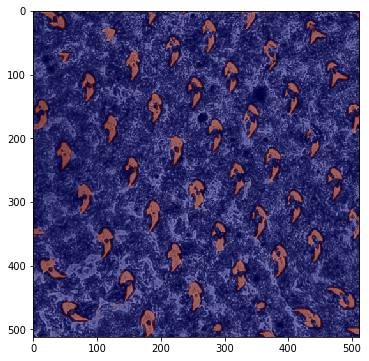

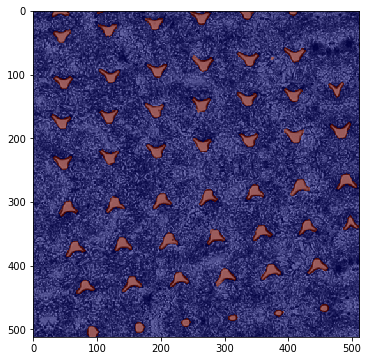

In [31]:
print('Train data')
n = 2
rinds = np.random.randint(0, len(train_ds), n)
for i in rinds:
    img, mask = train_ds[i]
#     img_no_tfm, _ = train_no_tfm_ds[i]
    fig = plot_overlay(img, mask, figsize=(6, 6))
#     fig = plot_images_row([img_no_tfm, img])
    plt.show()
#     if i == n - 1: break
    
# print('Valid data')
# n = 3
# for i, (img, mask) in enumerate(valid_ds):
#     plot_overlay(img, mask, figsize=(6, 6))
#     plt.show()
#     if i == n - 1: break

In [32]:
batch_size = 12
train_dl = DataLoader(
    dataset=train_ds,
    shuffle=True,
    num_workers=4,
    batch_size=batch_size,
    pin_memory=torch.cuda.is_available()
)
if valid_ds:
    valid_dl = DataLoader(
        dataset=valid_ds,
        shuffle=True,
        num_workers=4,
        batch_size=batch_size,
        pin_memory=torch.cuda.is_available()
    )
else:
    valid_dl = None
len(train_dl), len(valid_dl) if valid_dl else 0

(88, 44)

In [33]:
# lr = 1e-4
# n_epochs = 15

# # log_dir = 'runs/vgg16-jacc0.5'
# # writer = SummaryWriter(log_dir, flush_secs=1)
# writer = None

# # model = AlbuNet(pretrained=True)
# model = UNet16(pretrained=True)

# optimizer = Adam(model.parameters(), lr=lr)
# criterion = LossBinary(jaccard_weight=0.5)

# train_loop(model, train_dl, valid_dl,
#            optimizer, criterion,
#            n_epochs, writer)

In [34]:
import segmentation_models_pytorch as smp

# log_dir = 'runs/smp-se_resnext50_32x4d-jacc05'
# writer = SummaryWriter(log_dir, flush_secs=1)
writer = None

n_epochs = 10
lr_enc = 1e-4
lr_dec = 3e-4

model = smp.Unet(encoder_name='se_resnext50_32x4d', decoder_use_batchnorm=True)
# model = smp.Unet(encoder_name='resnet50', decoder_use_batchnorm=True)

optimizer = torch.optim.Adam([
    {'params': model.encoder.parameters(), 'lr': lr_enc},
    {'params': model.decoder.parameters(), 'lr': lr_dec},
])
criterion = CombinedLoss(bce_weight=0.5, jaccard=True, smooth=1e-15)

train_loop(model, train_dl, valid_dl,
           optimizer, criterion,
           n_epochs, writer)

Epoch 1/10
----------
........................................................................................
Train loss: 0.50034, train metric: 0.63830
............................................
Valid loss: 1.62318, valid metric: 0.61278
0 min 48 sec
Epoch 2/10
----------
........................................................................................
Train loss: 0.14659, train metric: 0.85774
............................................
Valid loss: -0.77432, valid metric: 0.78021
1 min 37 sec
Epoch 3/10
----------
........................................................................................
Train loss: 0.11523, train metric: 0.87944
............................................
Valid loss: 6.13113, valid metric: 0.51373
2 min 25 sec
Epoch 4/10
----------
........................................................................................
Train loss: 0.10188, train metric: 0.88584
............................................
Valid loss: 2.32482, valid metric: 

In [23]:
model_path = 'unet.pt'
torch.save(model.state_dict(), model_path)

In [ ]:
# l = list(list(model.children())[0].children())[0][0]

In [ ]:
# t = list(l.parameters())[0]

In [ ]:
# t.data.dtype

In [222]:
# import segmentation_models_pytorch as smp

# n_epochs = 10
# lr_dec = 1e-4

# # log_dir = 'runs/smp-se_resnext50_32x4d-jacc05'
# # writer = SummaryWriter(log_dir, flush_secs=1)
# writer = None

# model = smp.Unet(encoder_name='se_resnext50_32x4d', decoder_use_batchnorm=True)

# optimizer = torch.optim.Adam([
#     {'params': model.decoder.parameters(), 'lr': lr_dec}, 
# ])
# criterion = LossBinary(jaccard_weight=0.5)

# train_loop(model, train_dl, valid_dl,
#            optimizer, criterion,
#            n_epochs, writer)

# n_epochs = 10
# lr_enc = 1e-4
# lr_dec = 1e-4

# optimizer = torch.optim.Adam([
#     {'params': model.encoder.parameters(), 'lr': lr_enc},
#     {'params': model.decoder.parameters(), 'lr': lr_dec}, 
# ])

# train_loop(model, train_dl, valid_dl,
#            optimizer, criterion,
#            n_epochs, writer)

In [291]:
# import segmentation_models_pytorch as smp

# n_epochs = 5
# lr_dec = 3e-4

# # log_dir = 'runs/smp-se_resnet50-jacc05'
# # writer = SummaryWriter(log_dir, flush_secs=1)
# writer = None

# model = smp.Unet(encoder_name='se_resnet50', decoder_use_batchnorm=True)

# optimizer = torch.optim.Adam([
#     {'params': model.decoder.parameters(), 'lr': lr_dec}, 
# ])
# criterion = LossBinary(jaccard_weight=0.5)

# train_loop(model, train_dl, valid_dl,
#            optimizer, criterion,
#            n_epochs, writer)

In [292]:
# import segmentation_models_pytorch as smp

# n_epochs = 10
# lr_enc = 1e-4
# lr_dec = 1e-4

# # log_dir = 'runs/smp-se_resnet50-jacc05'
# # writer = SummaryWriter(log_dir, flush_secs=1)
# writer = None

# # model = smp.Unet(encoder_name='se_resnet50', decoder_use_batchnorm=True)

# optimizer = torch.optim.Adam([
#     {'params': model.encoder.parameters(), 'lr': lr_enc},
#     {'params': model.decoder.parameters(), 'lr': lr_dec}, 
# ])
# criterion = LossBinary(jaccard_weight=0.5)

# train_loop(model, train_dl, valid_dl,
#            optimizer, criterion,
#            n_epochs, writer)

# Prediction

In [14]:
from am_segm.utils import convert_to_image, plot_images_row

def predict_plot(model, inputs, targets):
    targets_pred = torch.sigmoid(model(inputs.to('cuda')))
    
    n = min(len(inputs), len(targets))
    for i in range(n):
        plot_images_row([
            convert_to_image(targets[i]),
            convert_to_image(inputs[i]),
#             convert_to_image(targets_pred[i]),
#             (np.sqrt(convert_to_image(targets_pred[i])) > 0.5).astype(int),
            (convert_to_image(targets_pred[i]) > 0.5).astype(int)
        ], titles=['Labels', 'Inputs', 'Predicted', 'Pred mask'])

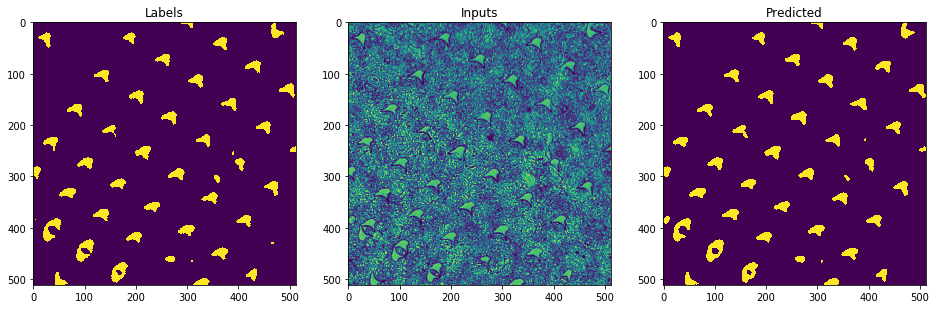

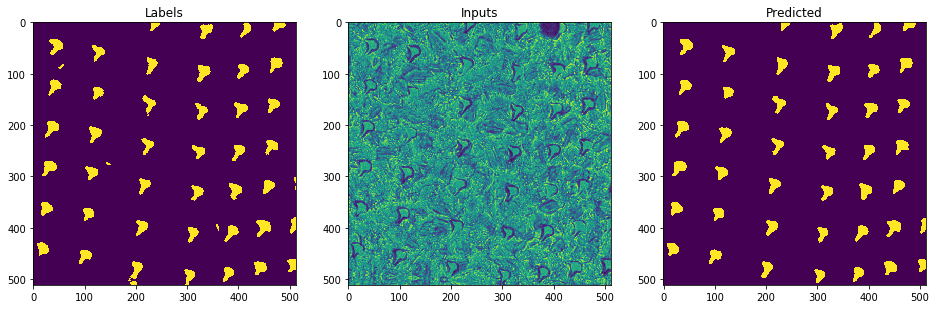

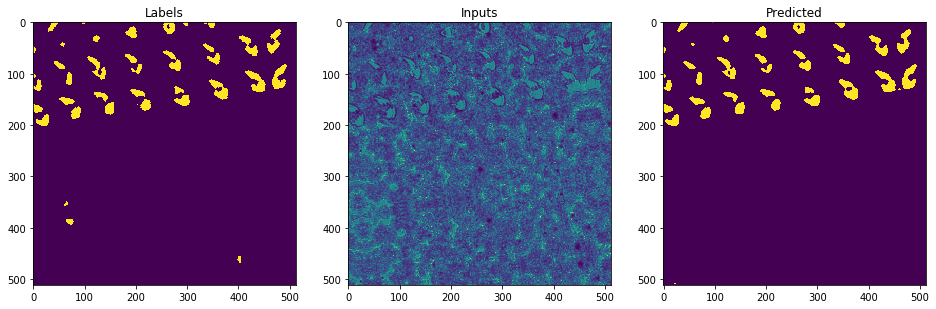

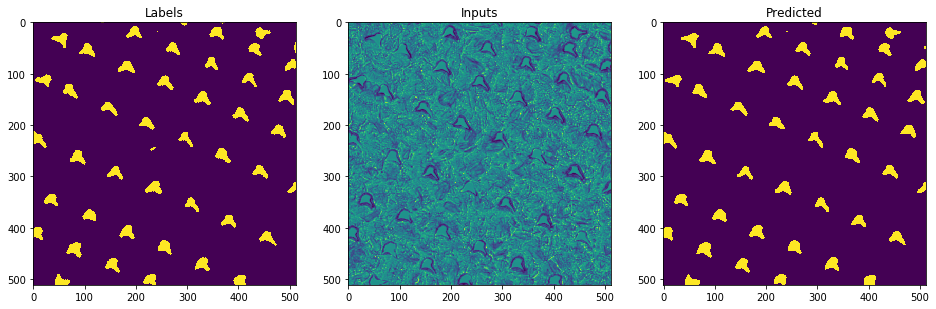

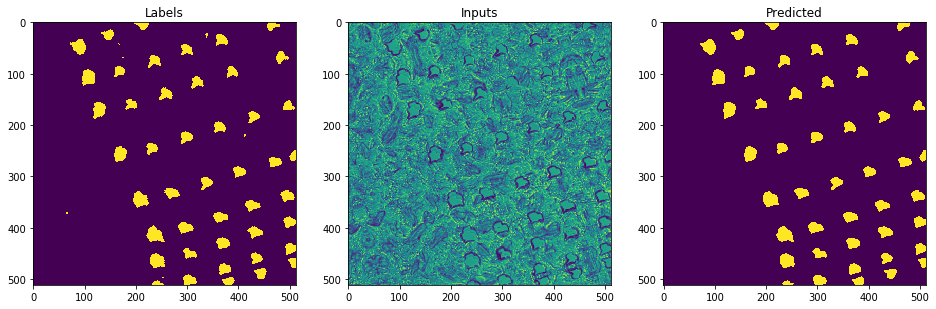

...

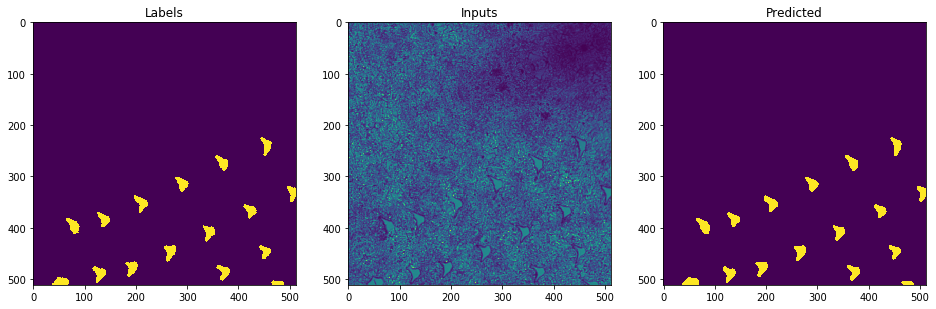

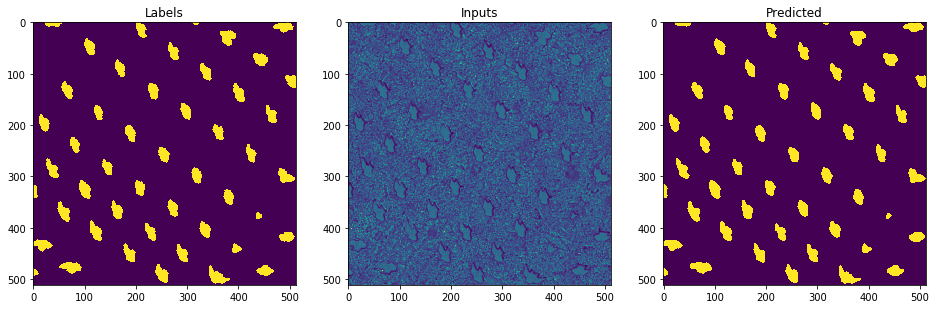

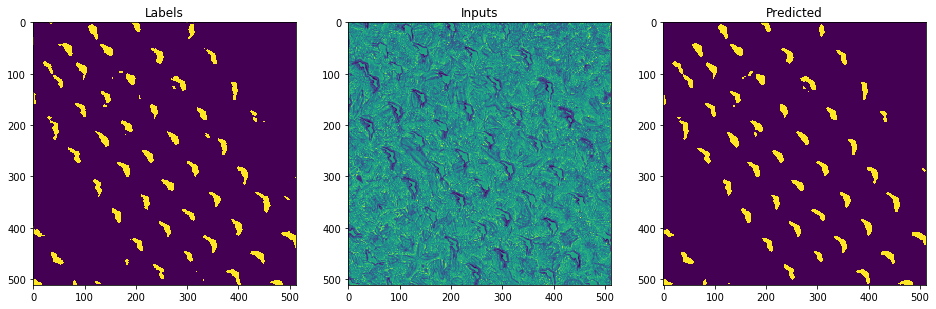

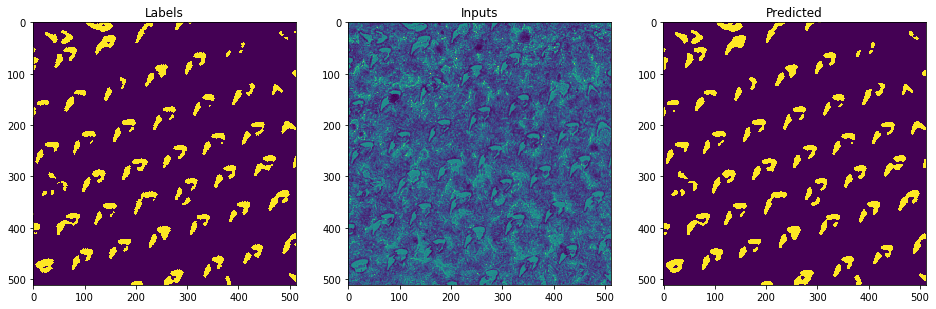

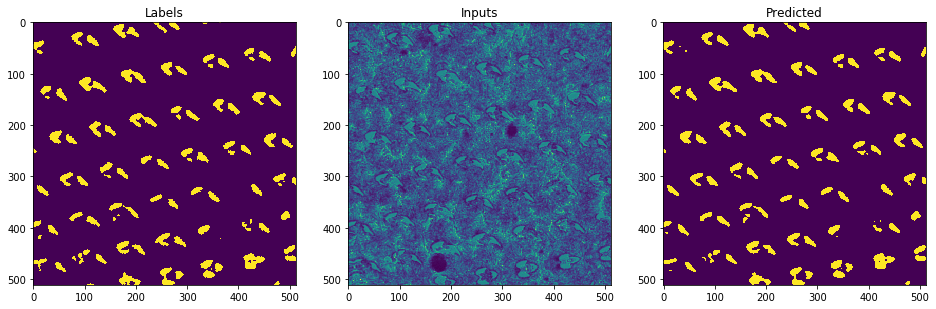

In [19]:
n = 2
for i, (inputs, targets) in enumerate(train_dl):
    predict_plot(model, inputs, targets)
    if i == n-1: break

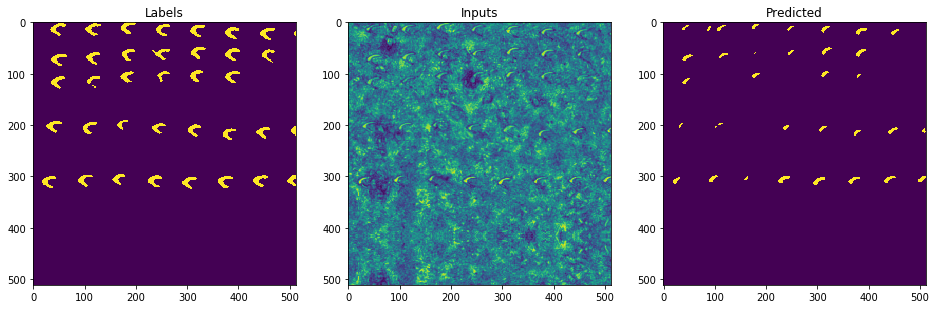

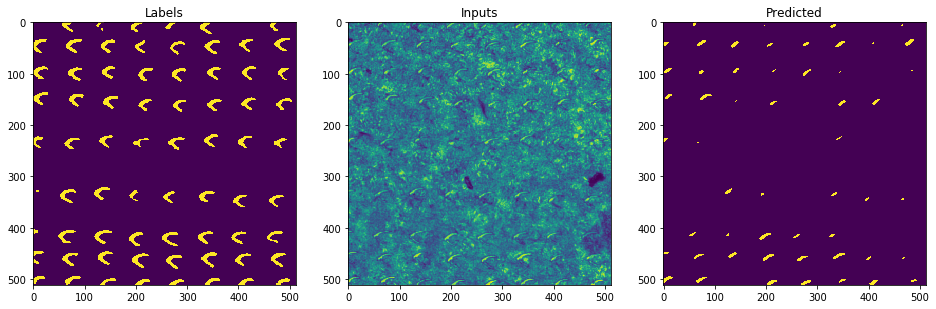

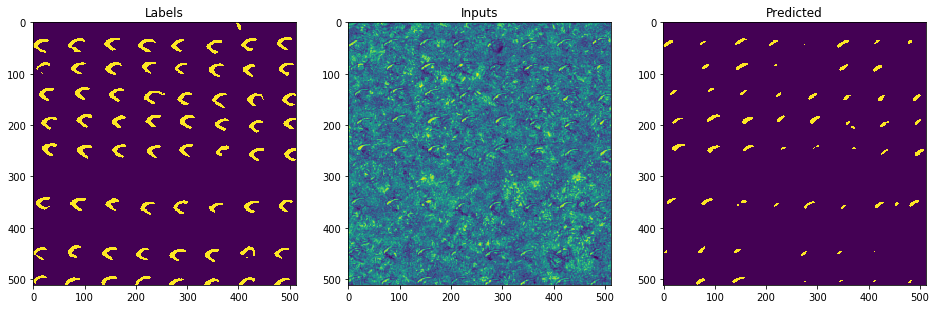

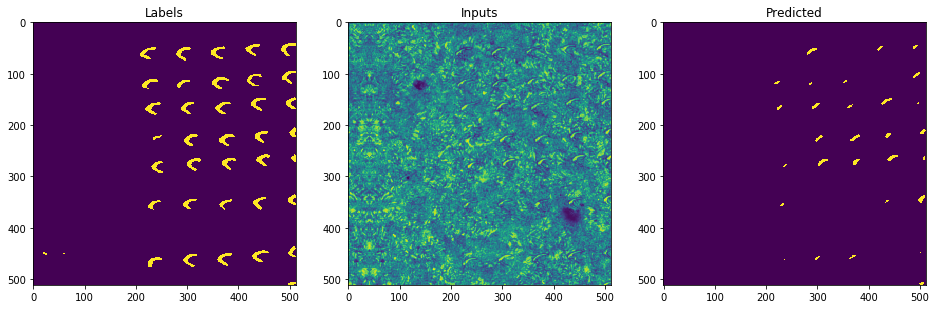

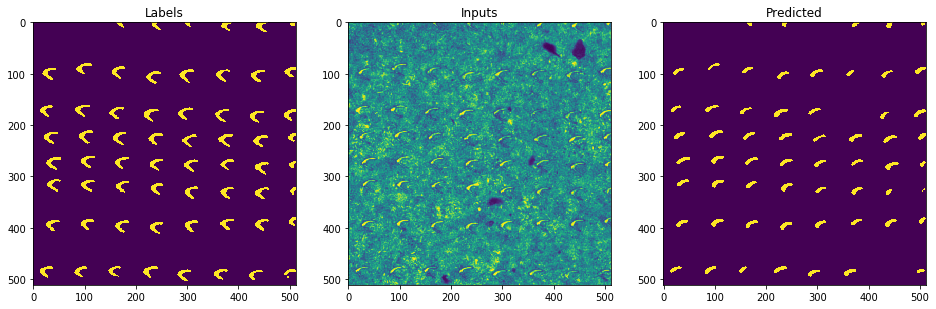

...

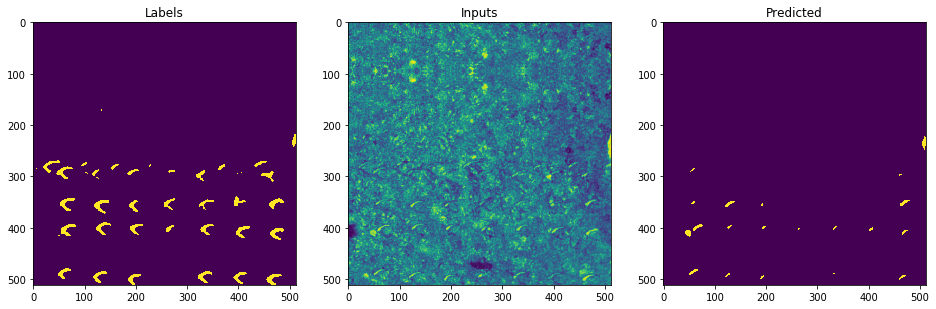

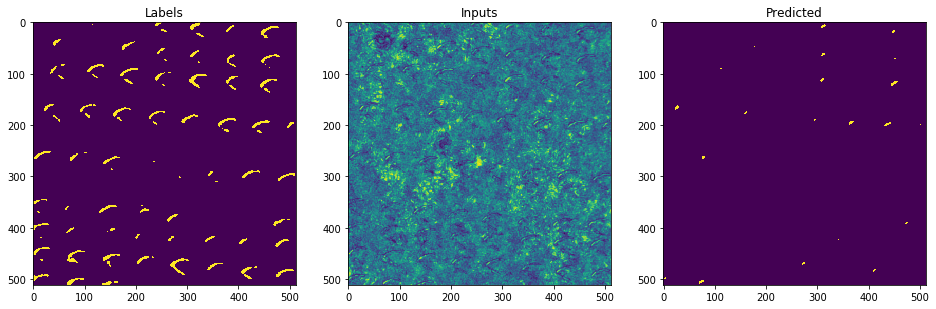

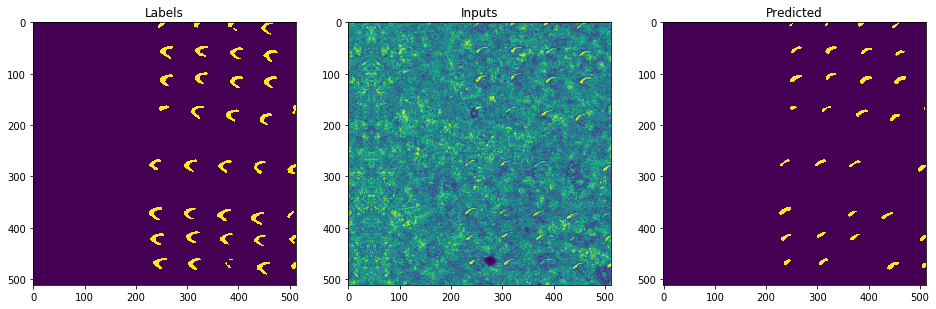

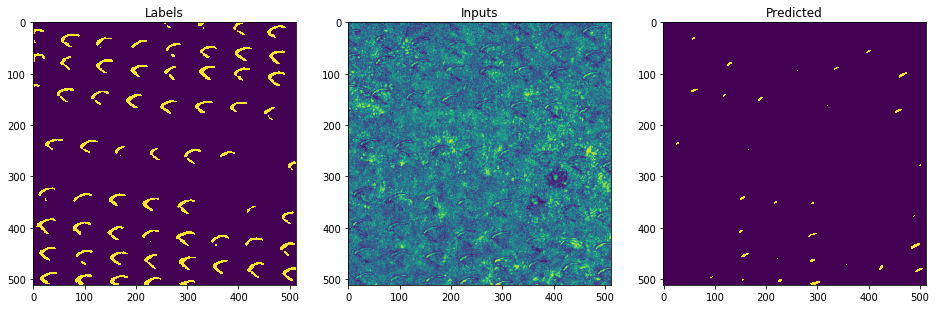

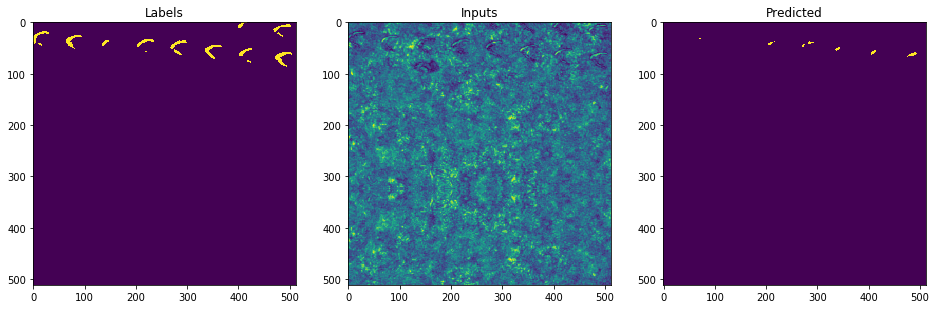

In [21]:
n = 2
for i, (inputs, targets) in enumerate(valid_dl):
    predict_plot(model, inputs, targets)
    if i == n - 1: break

# Save Predictions

In [24]:
import json
from shutil import copy, rmtree
from am_segm.utils import clean_dir, predict_save, stitch_tiles_at_path, overlay_group

In [26]:
# pred_path = Path('data/20171106_Hepa_Nov_ANALYSIS_PAPER/pseudo_tiles')
# pred_path = Path('data/20180514_Coculture_PAPER/pseudo_tiles')
pred_path = Path('data/Crops of mouse 7-8/pseudo_tiles')
# pred_path = Path('data/Crops of Exp9_P/pseudo_tiles')

ds = load_ds(pred_path,
             valid_transform(),
             [],
             ds_size=None)

unique_groups = ds.image_df.group.unique()
# unique_groups = ['FT1']

predict_save(pred_path, unique_groups, model, ds)

Well1_LR
Well4_UL
Well6_UL
Well6_LR
Well4_LR
Well1_UL
Well1_LR
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/000.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/000.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/001.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/001.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/002.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/002.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/003.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/003.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/004.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/004.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/005.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/005.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/006.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/006.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/007.png
data/Crops of mouse 7-8/pseudo_tiles

data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/071.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/072.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/072.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/073.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/073.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/074.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/074.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/075.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/075.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/076.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/076.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/077.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/077.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/078.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/mask/078.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_LR/source/079.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/043.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/044.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/044.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/045.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/045.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/046.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/046.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/047.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/047.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/048.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/048.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/049.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/049.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/050.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/mask/050.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_UL/source/051.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/013.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/014.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/014.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/015.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/015.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/016.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/016.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/017.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/017.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/018.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/018.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/019.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/019.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/020.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/020.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/021.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/083.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/083.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/084.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/084.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/085.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/085.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/086.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/086.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/087.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/087.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/088.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/088.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/089.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/089.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/source/090.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_UL/mask/090.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/053.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/053.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/054.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/054.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/055.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/055.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/056.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/056.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/057.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/057.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/058.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/058.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/059.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/059.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/source/060.png
data/Crops of mouse 7-8/pseudo_tiles/Well6_LR/mask/060.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/024.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/024.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/025.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/025.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/026.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/026.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/027.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/027.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/028.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/028.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/029.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/029.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/030.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/030.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/031.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/031.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/094.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/095.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/095.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/096.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/096.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/097.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/097.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/098.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/098.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/source/099.png
data/Crops of mouse 7-8/pseudo_tiles/Well4_LR/mask/099.png
Well1_UL
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/000.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/000.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/001.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/001.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/002.png
data/Crops of mouse 7-8/pseudo_

data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/065.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/066.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/066.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/067.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/067.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/068.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/068.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/069.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/069.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/070.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/070.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/071.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/071.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/072.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/mask/072.png
data/Crops of mouse 7-8/pseudo_tiles/Well1_UL/source/073.png
data/Crops of mouse 7-8/pseudo_tiles/Wel

In [77]:
# %debug

In [37]:
# i = -1
# image = image_list[i]
# mask = pred_list[i]
# image.shape, mask.shape

In [38]:
# fig = plot_overlay(image, mask)

In [37]:
meta_path = pred_path.parent / 'source_tiles'
stitch_tiles_at_path(pred_path, meta_path, True)

Stitching tiles at data/Crops of Exp9_P/pseudo_tiles/well1/source
Saved stitched image to data/Crops of Exp9_P/pseudo_tiles_stitched/well1/source.png
Stitching tiles at data/Crops of Exp9_P/pseudo_tiles/well1/mask
Saved stitched image to data/Crops of Exp9_P/pseudo_tiles_stitched/well1/mask.png
Stitching tiles at data/Crops of Exp9_P/pseudo_tiles/well7/source
Saved stitched image to data/Crops of Exp9_P/pseudo_tiles_stitched/well7/source.png
Stitching tiles at data/Crops of Exp9_P/pseudo_tiles/well7/mask
Saved stitched image to data/Crops of Exp9_P/pseudo_tiles_stitched/well7/mask.png


Overlaying: data/Crops of Exp9_P/pseudo_tiles_stitched/well1
Overlaying: data/Crops of Exp9_P/pseudo_tiles_stitched/well7


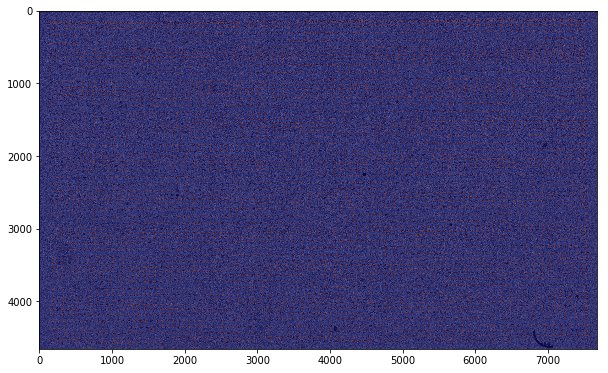

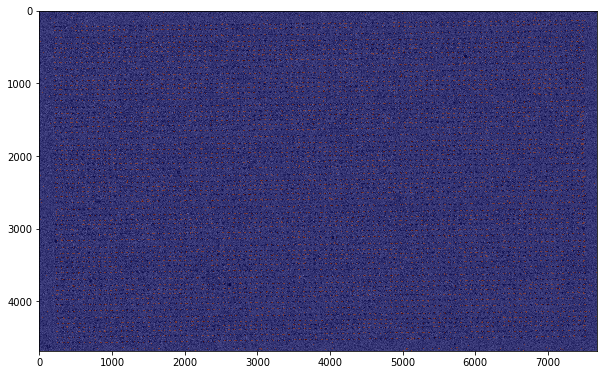

In [38]:
for group in unique_groups:
    fig = overlay_group(pred_path.parent / 'pseudo_tiles_stitched' / group);

In [120]:
# source_group_paths = .path.map(lambda p: p.parent.parent).unique().tolist()

In [121]:
# for path in source_group_paths:
#     group = path.name
#     source_path = path / 'meta.json'
#     dest_path = pseudo_path / group / 'meta.json'
#     print(f'Copying {source_path} -> {dest_path}')
#     copy(source_path, dest_path)

In [128]:
# ! ls -lah {pred_path / group}

# TTA Experiments

In [94]:
import albumentations.augmentations.functional as F
from albumentations.pytorch.transforms import img_to_tensor

In [95]:
normalize = albu.Normalize(p=1)

In [96]:
i = 13
image_path = valid_ds.image_df.iloc[i].path
image = cv2.imread(str(image_path))
image.shape

(512, 512, 3)

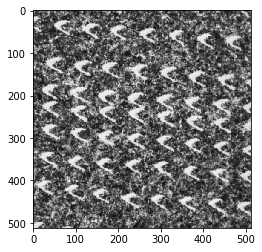

In [97]:
plt.imshow(image)

In [57]:
# plt.imshow(F.hflip(image))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


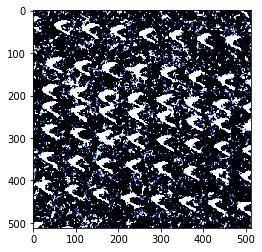

In [98]:
plt.imshow(normalize.apply(image))

In [199]:
# tta_tfm = [lambda im: im, F.hflip, F.vflip, lambda im: F.vflip(F.hflip(im))]
# tta_tfm = [
#     lambda im: im,
#     lambda im: albu.CLAHE()(image=im)['image']
# ]

# for _ in range(5):
#     plt.imshow(tfm.apply(image)[:,:,0])
#     plt.show()

In [175]:

tensors = [img_to_tensor(normalize.apply(tfm.apply(image)['image'])) for tfm in tta_tfm]

AttributeError: 'function' object has no attribute 'apply'

In [160]:
batch = torch.stack(tensors)
batch.shape

torch.Size([2, 3, 512, 512])

In [161]:
probs = torch.sigmoid(model(batch.to('cuda')))
probs.shape

torch.Size([2, 1, 512, 512])

In [162]:
# plt.imshow(convert_to_image(probs[0]))

In [163]:
# plt.imshow(F.hflip(convert_to_image(probs[1])))

In [165]:
pred_masks = [convert_to_image(prob) for prob in probs]
pred_mask_mean = np.mean(pred_masks, axis=0)
pred_mask_mean.shape

(512, 512)

In [166]:
image.shape

(512, 512, 3)

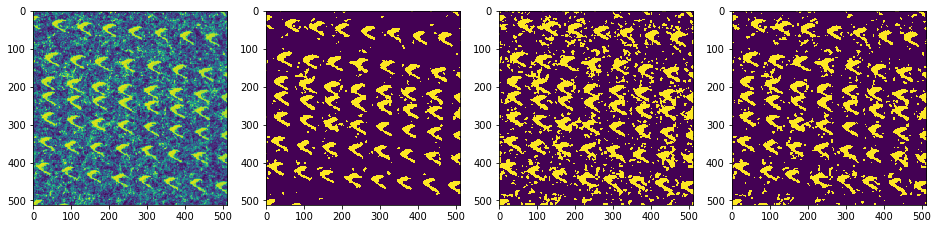

In [168]:
fig = plot_images_row([image[:,:,0], pred_masks[0] > 0.5, pred_masks[1] > 0.5, pred_mask_mean > 0.5])

# Inference

In [358]:
from segmentation.inference import SegmentationModel

In [359]:
segm_model = SegmentationModel('unet.pth', tile_size=512)

2019-01-23 08:58:33,848 - am-segm - INFO - Loading model...
2019-01-23 08:58:33,848 - am-segm - INFO - Loading model...


In [360]:
# pred_mask = segm_model.predict_mask('data/raw/n1_SELECTED/source.png')
pred_mask = segm_model.predict_mask('data/raw/AM_cropped_Rho.png')

2019-01-23 08:58:40,905 - am-segm - INFO - Predicting mask for data/raw/AM_cropped_Rho.png...
2019-01-23 08:58:40,905 - am-segm - INFO - Predicting mask for data/raw/AM_cropped_Rho.png...
2019-01-23 08:58:54,084 - am-segm - INFO - Done
2019-01-23 08:58:54,084 - am-segm - INFO - Done


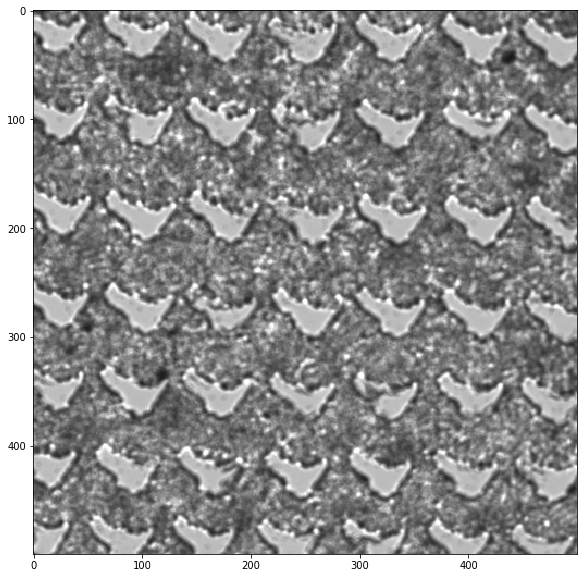

In [362]:
image = cv2.imread('data/raw/AM_cropped_Rho.png')
plot_image(image[1500:2000,1500:2000])

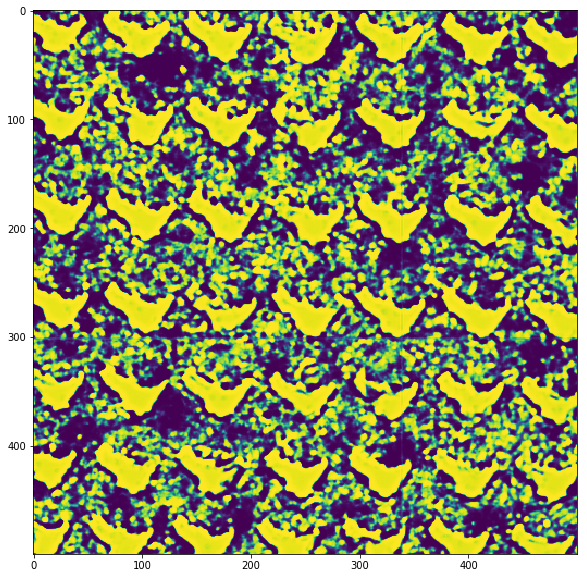

In [364]:
plot_image(pred_mask[1500:2000,1500:2000])

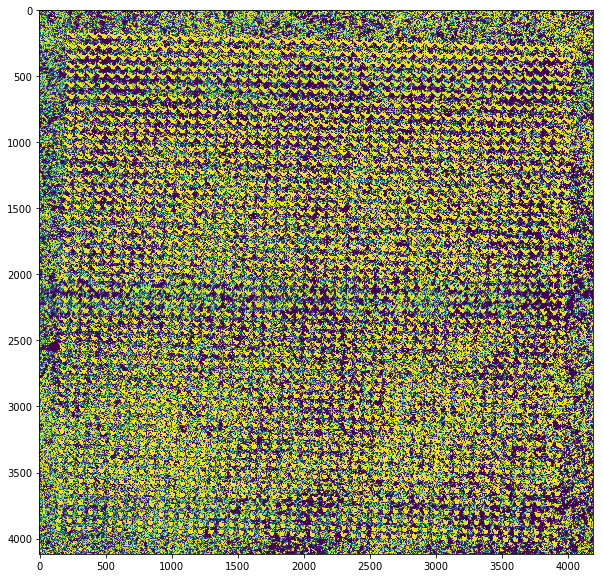

In [365]:
plot_image(pred_mask)

# Other